In [1]:
import cospar as cs
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scvi
import matplotlib
import os
os.environ['QT_QPA_PLATFORM']='offscreen'

Global seed set to 0


In [2]:
#sc.settings.set_figure_params(dpi=100, facecolor='white')
cs.settings.set_figure_params()
cs.settings.data_path = "/media/chang/HDD-8/chang/cloneseq/cospar_data"
cs.settings.figure_path = "/media/chang/HDD-8/chang/cloneseq/cospar"
cs.hf.set_up_folders()

In [ ]:
adata = sc.read("/media/chang/HDD-8/chang/cloneseq/new_merged.h5ad")
adata.uns["data_des"] = "/media/chang/HDD-8/chang/cloneseq/cospar"
adata.var_names_make_unique()
adata.var["mito"] = atada.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mito"], inplace=True)
adata

In [49]:
adata.obs["unique_clone"] = adata.obs["X_scar_assignment_3"].astype(str) + adata.obs["Batch"].astype(str)
adata.obs["time_info"] = adata.obs['Batch'].str[:4]
adata.obs['Area'] = adata.obs['Batch'].str[5:8]
adata.obs["time_info"].value_counts()

GW15    62354
GW18    48960
Name: time_info, dtype: int64

In [64]:
adata.obs

,dropkick_score,dropkick_label,arcsinh_n_genes_by_counts,doublet,doublet_score,X_scar_assignment_3,X_scar_assignment_3_n_BC,X_scar_assignment_10,X_scar_assignment_10_n_BC,Batch,...,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,n_genes,unique_clone,time_info,leiden,Area,state_info
AAACCCAAGCGATGGT,0.955486,True,8.528331,0.0,5.905538e-09,IndexE_Bit1_F_215-Bit2_F_317-Bit3_F_302,1,IndexE_Bit1_F_215-Bit2_F_317-Bit3_F_302,1,GW15_rep1_tube1,...,32.340667,31.343472,3.476412,0.919236,2528,IndexE_Bit1_F_215-Bit2_F_317-Bit3_F_302GW15_re...,GW15,2,rep,2
AAACCCAAGCGCCGTT,0.862242,True,8.805375,0.0,2.028429e-03,IndexE_Bit1_F_055-Bit2_F_112-Bit3_F_332,1,IndexE_Bit1_F_055-Bit2_F_112-Bit3_F_332,1,GW15_rep1_tube1,...,28.143942,31.012289,3.466120,0.800411,3335,IndexE_Bit1_F_055-Bit2_F_112-Bit3_F_332GW15_re...,GW15,0,rep,0
AAACCCAAGGGTGAGG,0.891338,True,9.349406,0.0,1.474724e-01,IndexE_Bit1_F_200-Bit2_F_272-Bit3_F_165,1,IndexE_Bit1_F_200-Bit2_F_272-Bit3_F_165,1,GW15_rep1_tube1,...,24.517507,32.613850,3.514938,0.759874,5746,IndexE_Bit1_F_200-Bit2_F_272-Bit3_F_165GW15_re...,GW15,0,rep,0
AAACCCAAGGTCGAGT,0.937064,True,9.017241,0.0,4.034527e-02,IndexE_Bit1_F_154-Bit2_F_054-Bit3_F_280,1,IndexE_Bit1_F_154-Bit2_F_054-Bit3_F_280,1,GW15_rep1_tube1,...,28.303600,31.694307,3.487201,0.829387,4122,IndexE_Bit1_F_154-Bit2_F_054-Bit3_F_280GW15_re...,GW15,0,rep,0
AAACCCAAGTGCACCC,0.924538,True,9.079548,0.0,1.505040e-02,IndexE_Bit1_F_406-Bit2_F_378-Bit3_F_157,1,IndexE_Bit1_F_406-Bit2_F_378-Bit3_F_157,1,GW15_rep1_tube1,...,25.723161,31.894861,3.493316,0.758035,4387,IndexE_Bit1_F_406-Bit2_F_378-Bit3_F_157GW15_re...,GW15,3,rep,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGGTCGAATGG,0.994178,True,9.077494,0.0,1.111422e-01,IndexE_Bit1_F_027-Bit2_F_366-Bit3_F_234,1,IndexE_Bit1_F_027-Bit2_F_366-Bit3_F_234,1,GW18_V1_tube3,...,25.152385,37.517048,3.651101,0.889208,4378,IndexE_Bit1_F_027-Bit2_F_366-Bit3_F_234GW18_V1...,GW18,0,V1_,0
TTTGTTGGTGAGCTCC,0.753809,True,8.578853,0.0,5.153427e-05,"IndexE_Bit1_F_077-Bit2_F_453-Bit3_F_202, Index...",13,"IndexE_Bit1_F_077-Bit2_F_453-Bit3_F_202, Index...",14,GW18_V1_tube3,...,32.593147,37.061256,3.639197,1.086560,2659,"IndexE_Bit1_F_077-Bit2_F_453-Bit3_F_202, Index...",GW18,7,V1_,7
TTTGTTGGTTAGGAGC,0.675667,True,8.680332,0.0,2.595489e-08,"IndexE_Bit1_F_040-Bit2_F_068-Bit3_F_272, Index...",26,"IndexE_Bit1_F_040-Bit2_F_068-Bit3_F_272, Index...",24,GW18_V1_tube3,...,29.171855,29.458063,3.416351,0.777463,2943,"IndexE_Bit1_F_040-Bit2_F_068-Bit3_F_272, Index...",GW18,5,V1_,5
TTTGTTGTCAACACGT,0.861525,True,9.056023,0.0,4.268435e-01,IndexE_Bit1_F_327-Bit2_F_229-Bit3_F_458,1,IndexE_Bit1_F_327-Bit2_F_229-Bit3_F_458,1,GW18_V1_tube3,...,24.525712,34.050205,3.556782,0.789789,4285,IndexE_Bit1_F_327-Bit2_F_229-Bit3_F_458GW18_V1...,GW18,4,V1_,4


In [ ]:
sc.pp.filter_cells(adata, min_genes=500)
sc.pp.filter_genes(adata, min_counts=3)
adata.layers["counts"] = adata.layers['scar'].copy() # preserve counts
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata.raw = adata 
adata

In [20]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="Batch")
model = scvi.model.SCVI(adata, n_latent=32)

INFO     Using batches from adata.obs["Batch"]                                               
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 111314 cells, 32945 vars, 15      
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/home/chang/miniconda3/envs/venv/lib/python3.8/site-packages/scvi/model/_utils.py:272: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  warnings.warn(


In [21]:
model.train()

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 72/72: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 72/72 [22:45<00:00, 18.97s/it, loss=7.01e+03, v_num=1]


In [22]:
latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent

In [24]:
sc.pp.neighbors(adata, use_rep="X_scVI", n_pcs=32)
sc.tl.umap(adata)
adata.obsm['X_emb'] = adata.obsm['X_umap']

In [56]:
sc.tl.leiden(adata, resolution=.3)

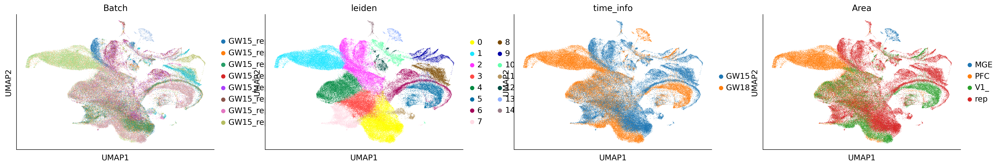

In [57]:
sc.pl.umap(adata, color=['Batch','leiden','time_info','Area'])

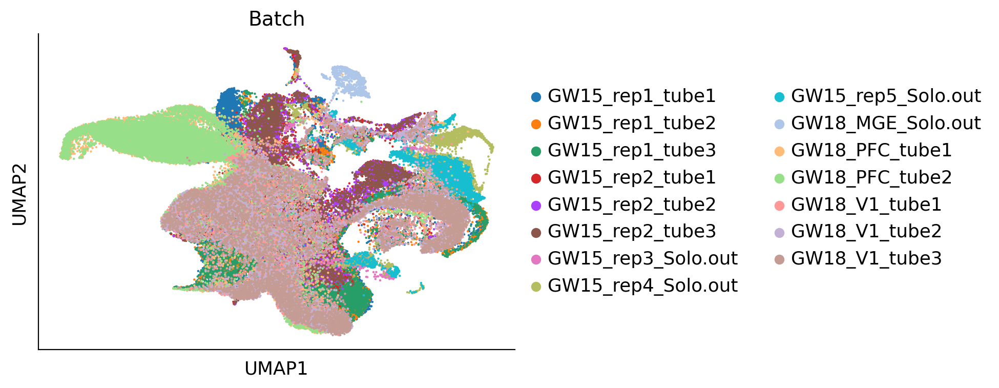

In [71]:
sc.pl.umap(adata, color=['Batch'], size=10)

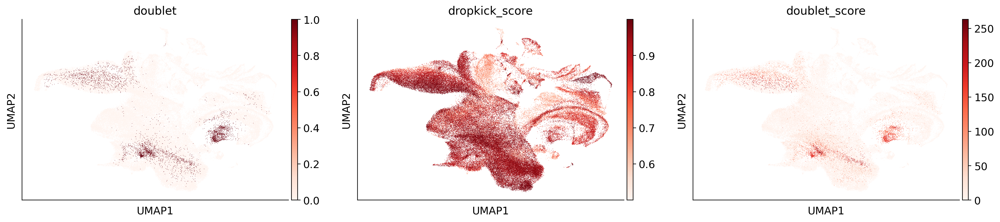

In [66]:
sc.pl.umap(adata, color=['doublet','dropkick_score','doublet_score'])

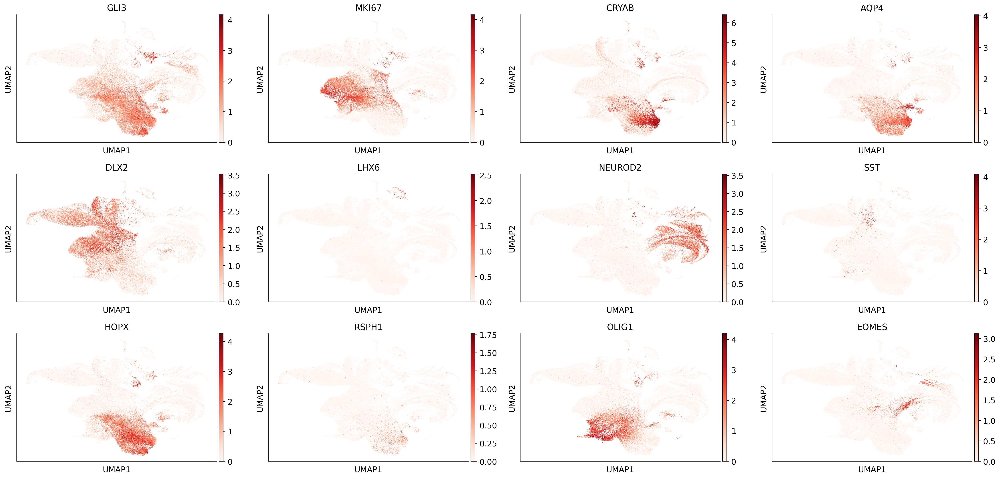

In [38]:
sc.pl.umap(adata, color=['GLI3','MKI67','CRYAB','AQP4','DLX2','LHX6','NEUROD2','SST','HOPX','RSPH1','OLIG1','EOMES'])

In [58]:
cs.pp.get_X_clone(adata,adata.obs.index.tolist(),adata.obs.unique_clone.tolist())
adata.obs["state_info"] = adata.obs['leiden'].astype(str)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 111314/111314 [00:00<00:00, 1185928.81it/s]


Data saved at adata.uns['barcode_heatmap']


<AxesSubplot:title={'center':'22689 clones'}>

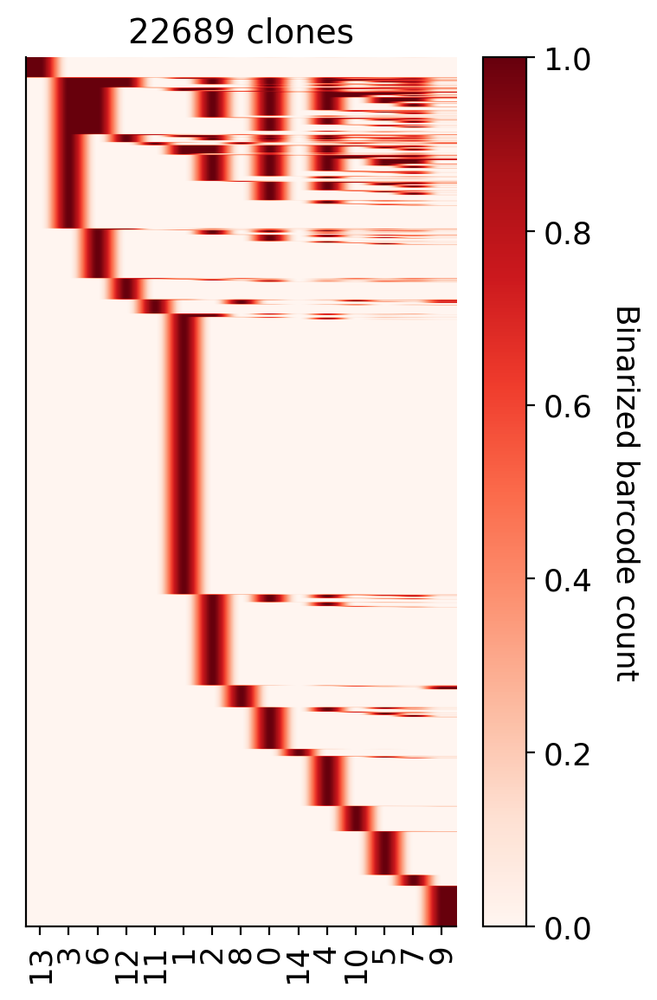

In [59]:
cs.pl.barcode_heatmap(adata,selected_times=None,
        color_bar=True,log_transform=False,binarize=True)

normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
Results saved as dictionary at adata.uns['fate_coupling_X_clone']


<AxesSubplot:title={'center':'source: X_clone'}>

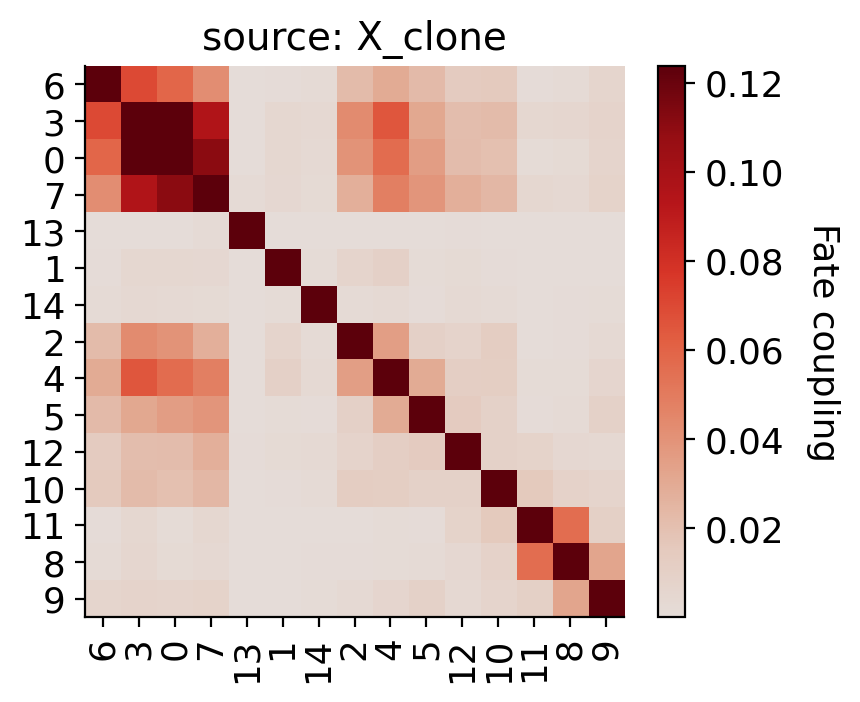

In [60]:
cs.tl.fate_coupling(adata,source='X_clone') # compute the fate coupling
cs.pl.fate_coupling(adata,source='X_clone') # actually plot the coupling

In [61]:
cs.tl.fate_hierarchy(adata,source='X_clone') # compute the fate hierarchy
cs.pl.fate_hierarchy(adata,source='X_clone') # actually plot the hierarchy

normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-normalize the matrix
normalize by X_clone
each cluster do not have a unique time point. Simply column-n

In [62]:
my_tree_refined = adata.uns["fate_hierarchy_X_clone"]["tree"]

Tree node '' (0x7f0bcada4e8)

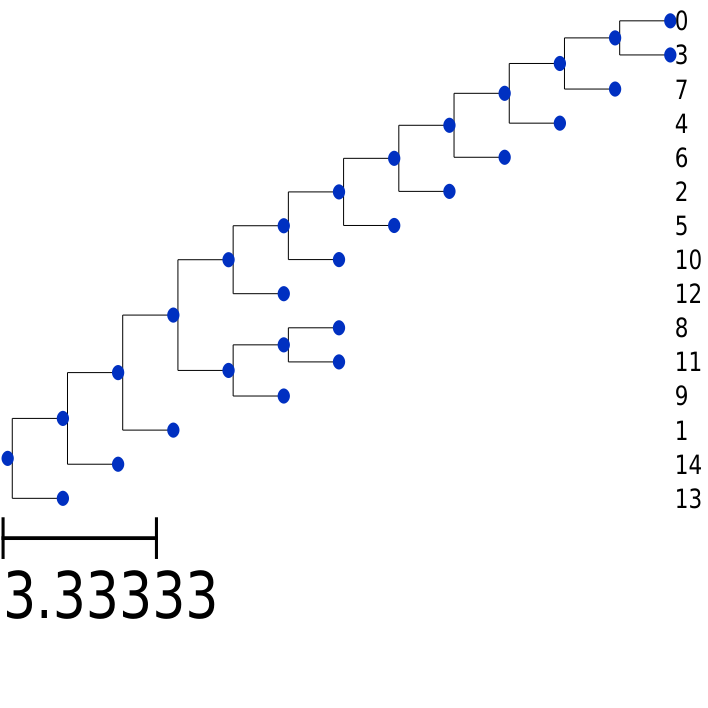

In [63]:
cs.pl.visualize_tree(
    my_tree_refined,
    color_coding=None,
    mode="r",
    data_des=f"my_tree",
    figure_path="/home/chang/data_dir/cospar",
    dpi=300
)

In [13]:
adata2 = cs.tmap.infer_Tmap_from_multitime_clones(
    adata,
    clonal_time_points=["GW15","GW18"],
    sparsity_threshold=0.1,
    intraclone_threshold=0.2,
    max_iter_N=10,
    epsilon_converge=0.01,
)

------Compute the full Similarity matrix if necessary------
--> Compute similarity matrix: computing new; beta=0.1
Smooth round: 1
--> Time elapsed: 0.005953073501586914
Smooth round: 2
--> Time elapsed: 0.028536081314086914
Smooth round: 3
--> Time elapsed: 0.12994813919067383
--> Orignal sparsity=0.29680754580899055, Thresholding
--> Final sparsity=0.21954951588673013
similarity matrix truncated (Smooth round=3):  0.09625029563903809
Smooth round: 4
--> Time elapsed: 0.23419642448425293
--> Orignal sparsity=0.42566835269591563, Thresholding
--> Final sparsity=0.309216775039273
similarity matrix truncated (Smooth round=4):  0.08124685287475586
Smooth round: 5
--> Time elapsed: 0.28362059593200684
--> Orignal sparsity=0.4792675657523679, Thresholding
--> Final sparsity=0.3707213953949174
similarity matrix truncated (Smooth round=5):  0.0956106185913086
--> Save the matrix at every 5 rounds


PermissionError: [Errno 13] Permission denied: '/_Similarity_matrix_with_all_cell_states_kNN20_Truncate0001_SM5.npz'

In [128]:
adata.uns["available_map"]

[]

In [126]:
map_backward = False
cs.pl.single_cell_transition(
    adata,
    selected_state_id_list=["7","12"],
    source="transition_map",
    map_backward=map_backward,
)



Error: transition_map should be among []


In [107]:
cs.tl.fate_potency(
    adata,
    source="transition_map",
    map_backward=True,
    method="norm-sum",
    fate_count=True,
)
cs.pl.fate_potency(adata, source="transition_map")

ValueError: source should be among []

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 218/218 [00:00<00:00, 856.88it/s]


Data saved at adata.uns['clonal_fate_bias']


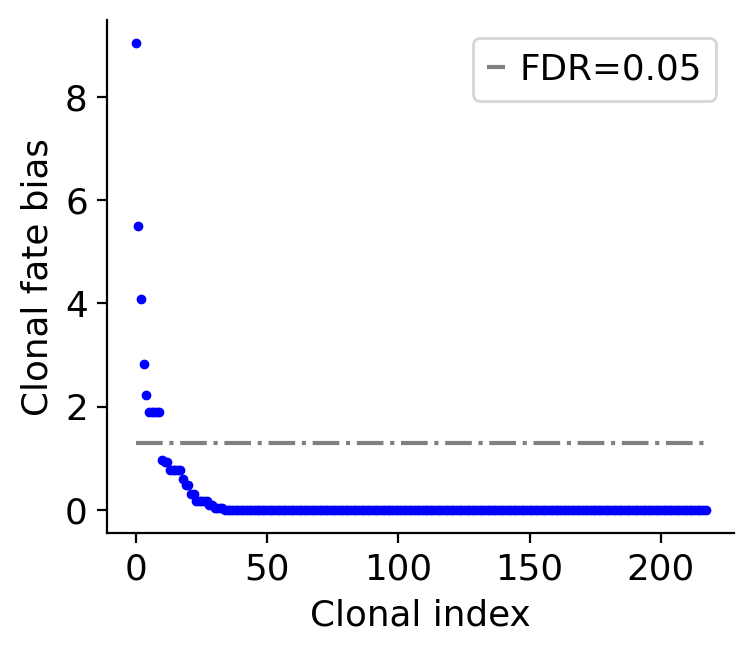

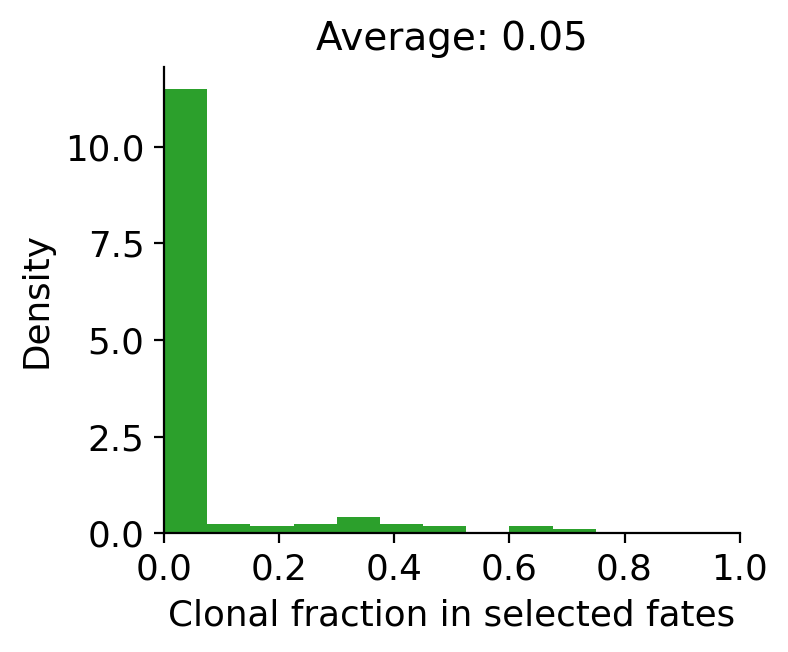

In [202]:
cs.tl.clonal_fate_bias(adata,selected_fate="7",alternative='two-sided') # compute the fate hierarchy
cs.pl.clonal_fate_bias(adata) # actually plot the hierarchy

In [203]:
result=adata.uns['clonal_fate_bias']
result

,Clone_ID,Clone_size,Q_value,Fate_bias,clonal_fraction_in_target_fate
0,163,72.0,9.352509e-10,9.029072,0.291667
1,184,13.0,3.211170e-06,5.493337,0.615385
2,212,94.0,8.336782e-05,4.079002,0.180851
3,49,14.0,1.508012e-03,2.821595,0.428571
4,46,25.0,5.819106e-03,2.235144,0.280000
...,...,...,...,...,...
213,81,15.0,1.000000e+00,-0.000000,0.000000
214,83,38.0,1.000000e+00,-0.000000,0.000000
215,84,9.0,1.000000e+00,-0.000000,0.000000
216,71,5.0,1.000000e+00,-0.000000,0.000000


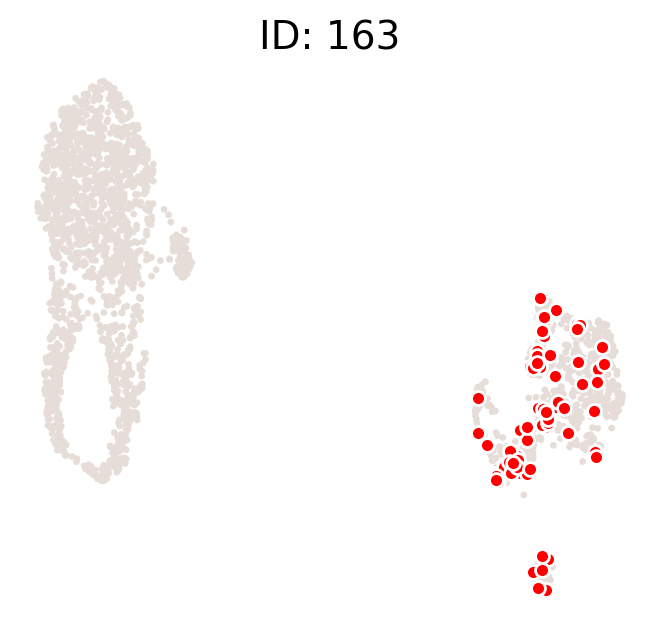

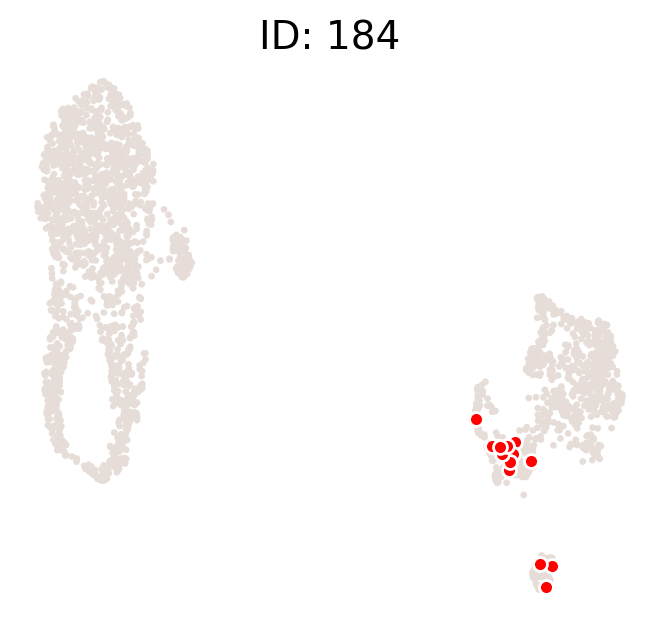

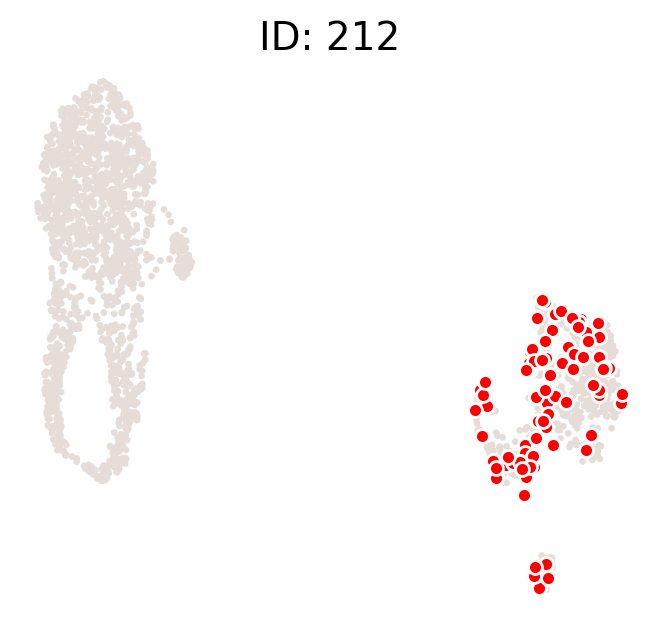

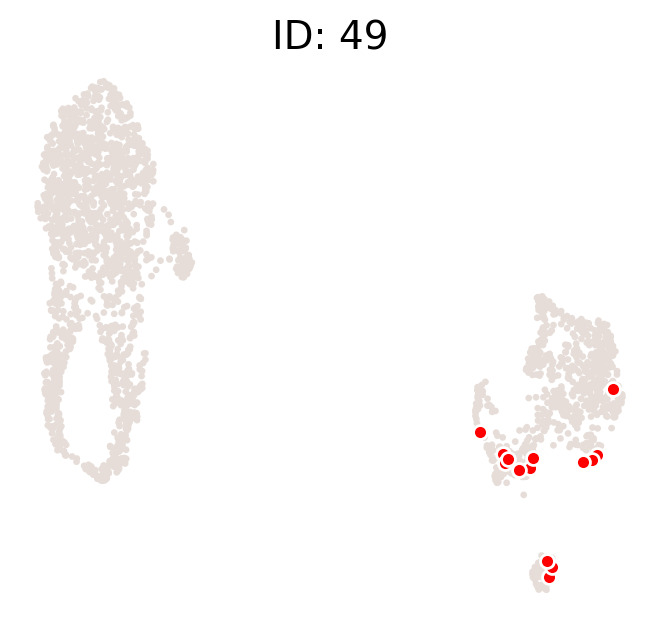

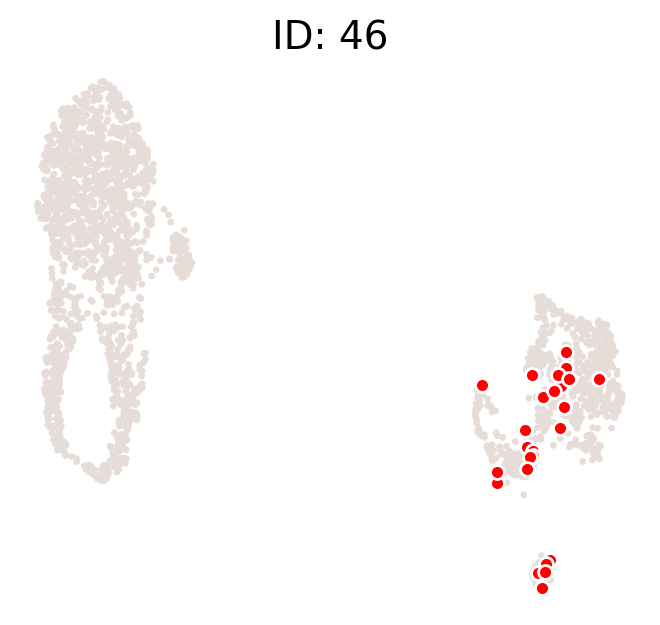

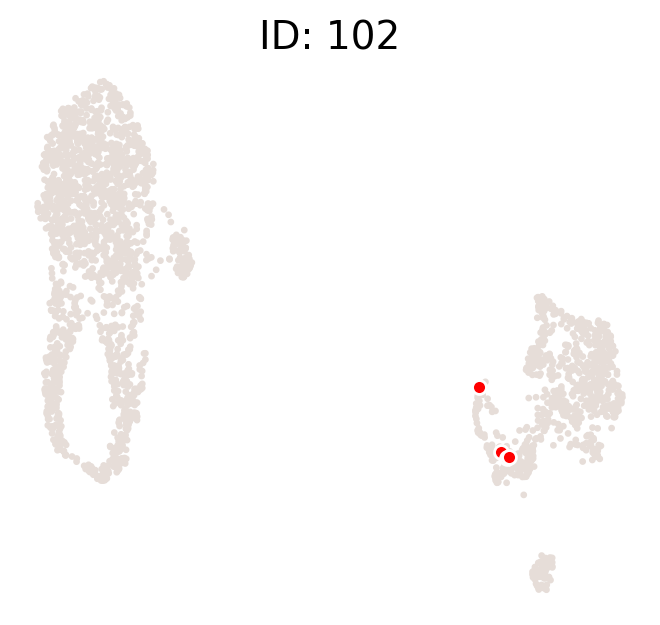

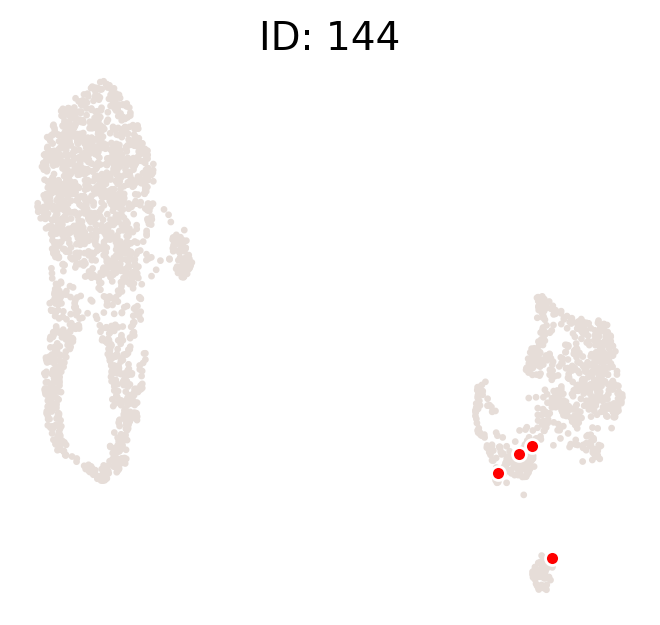

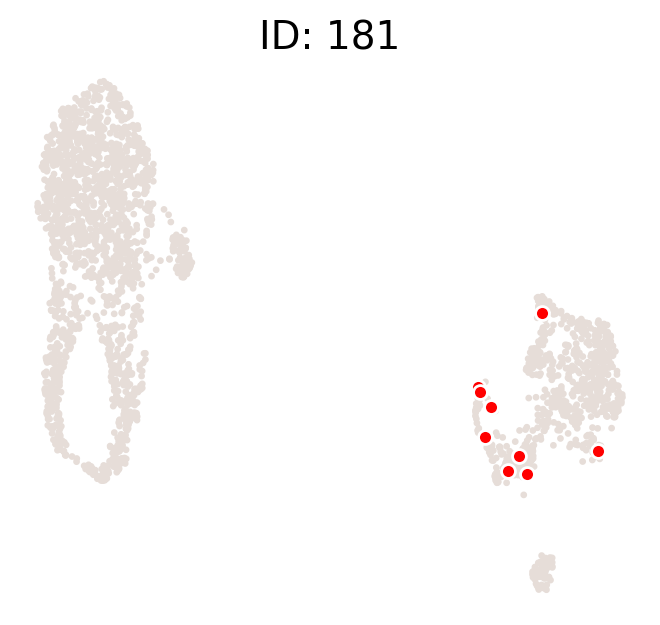

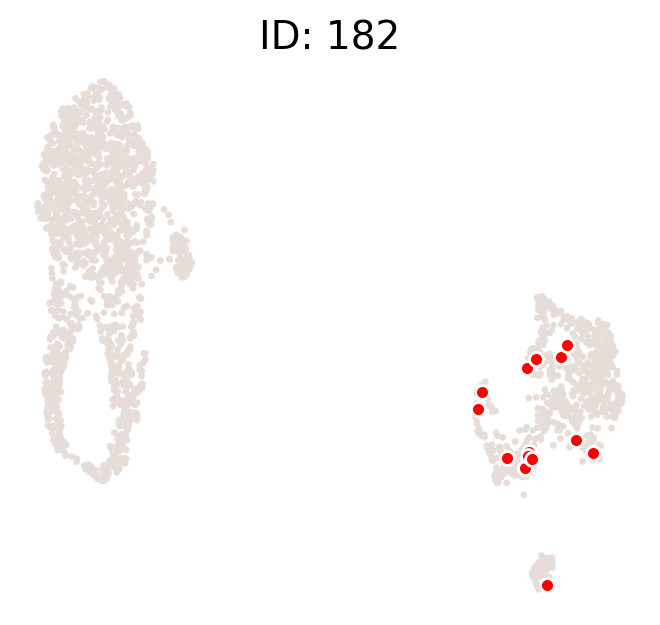

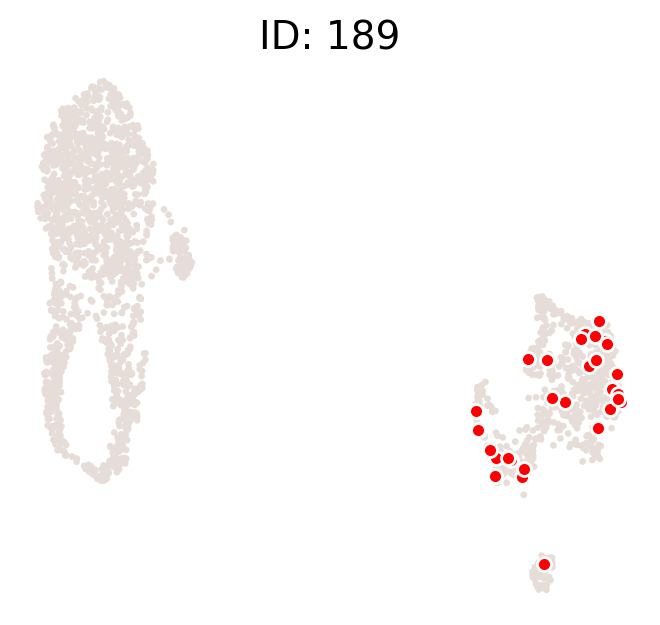

In [204]:
ids=result['Clone_ID'][:10]
cs.pl.clones_on_manifold(adata,selected_clone_list=ids,color_list=['black','red','blue'],clone_markersize=10,)

In [171]:
adata_3 = cs.tmap.infer_Tmap_from_clonal_info_alone(
    adata, method="weinreb", later_time_point="1", selected_fates="AT1",clonal_time_points="1",
)

ValueError: Selected time points are not all among ['0' '1'], or less than 2 time points are selected. Computation aborted!

In [ ]:
cs.tl.fate_coupling(adata,selected_fates=selected_fates,source='transition_map')
cs.pl.fate_coupling(adata,source='transition_map')

In [ ]:
cs.tl.fate_hierarchy(adata,selected_fates=selected_fates,source='transition_map')
cs.pl.fate_hierarchy(adata,source='transition_map')